# Detr Code for Training

In [26]:
!python main.py --coco_path "/home/wenisch/Atom360/AI/Learning/data/dataset" \
                --dataset_file "coco" \
                --output_dir "outputs/bbox" \
                --resume "outputs/bbox/checkpoint.pth" \
                --lr 1e-5 \
                --num_classes 3 \
                --batch_size 1 \
                --del_weights False \
                --start_epoch 75 \
                --epochs 100

Not using distributed mode
git:
  sha: a9af27c6a0fe475b729f527e52dde15adefdac8e, status: has uncommited changes, branch: main

Namespace(lr=1e-05, lr_backbone=1e-05, batch_size=1, weight_decay=0.0001, epochs=100, lr_drop=200, clip_max_norm=0.1, frozen_weights=None, backbone='resnet50', dilation=False, position_embedding='sine', enc_layers=6, dec_layers=6, dim_feedforward=2048, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, pre_norm=False, masks=False, aux_loss=True, set_cost_class=1, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, bbox_loss_coef=5, giou_loss_coef=2, eos_coef=0.1, num_classes=3, dataset_file='coco', coco_path='/home/wenisch/Atom360/AI/Learning/data/dataset', coco_panoptic_path=None, remove_difficult=False, output_dir='outputs/bbox', device='cuda', seed=42, resume='outputs/bbox/checkpoint.pth', del_weights='False', start_epoch=75, eval=False, num_workers=2, world_size=1, dist_url='env://', distributed=False)
number of params: 41279752
loadi

In [22]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('outputs/bbox')]

/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(


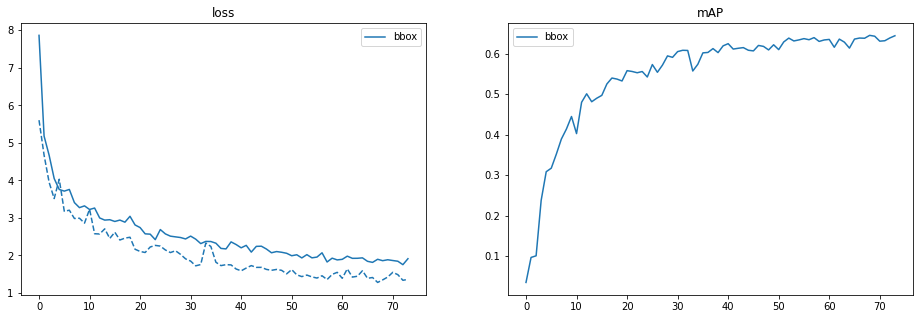

In [23]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling t

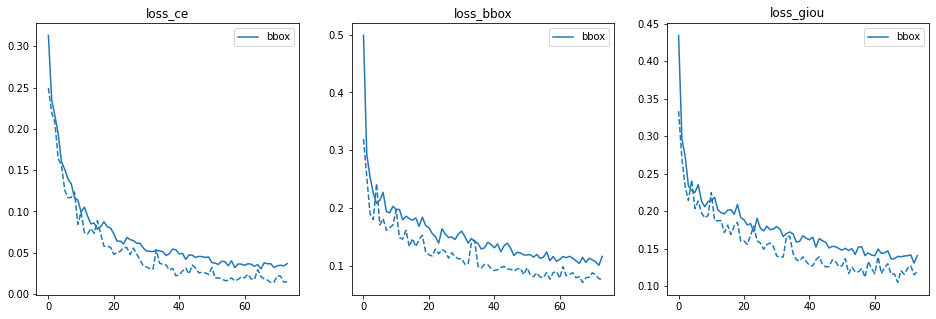

In [24]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(


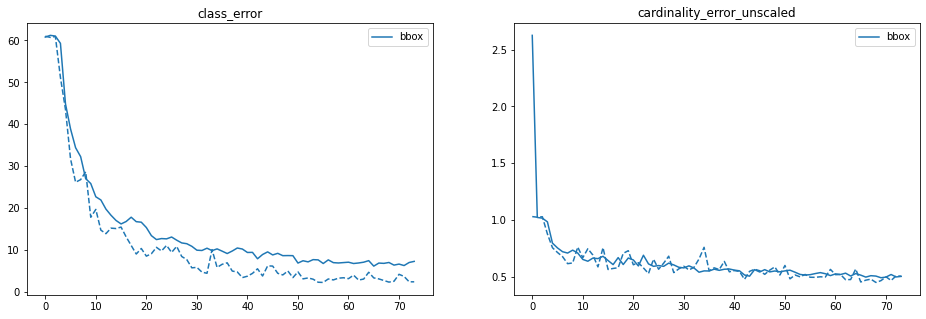

In [25]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)

#### Get Pretrained Weights
uncomment for downloading weights

In [ ]:
# import torch
# checkpoint = torch.hub.load_state_dict_from_url(
#             url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
#             map_location='cpu',
#             check_hash=True)

# # Remove class weights
# del checkpoint["model"]["class_embed.weight"]
# del checkpoint["model"]["class_embed.bias"]
# # del checkpoint["model"]["query_embed.weight"]

# # Save
# torch.save(checkpoint,
#            'weights/detr-r50_no-class-head2.pth')

### Test the model

In [11]:
!python test.py \
    --dataset_file "oral" \
    --data_path "/home/wenisch/Atom360/AI/Learning/data/dataset" \
    --resume "outputs/bbox/checkpoint.pth"

python: can't open file '/home/wenisch/Atom360/AI/Learning/algo/finetune-detr/test.py': [Errno 2] No such file or directory


### Load the fine-tuned model

In [12]:
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as T

num_classes = 3
finetuned_classes = ['N/A', 'spall', 'rebar', 'crack']
# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [14]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load('outputs/bbox/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();

Using cache found in /home/wenisch/.cache/torch/hub/facebookresearch_detr_main


In [15]:
def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()
  
# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)
    
def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

In [16]:
def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)
  # print(outputs)
  for threshold in [0.9, 0.5, 0.1]:
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)

    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)


### With a training image

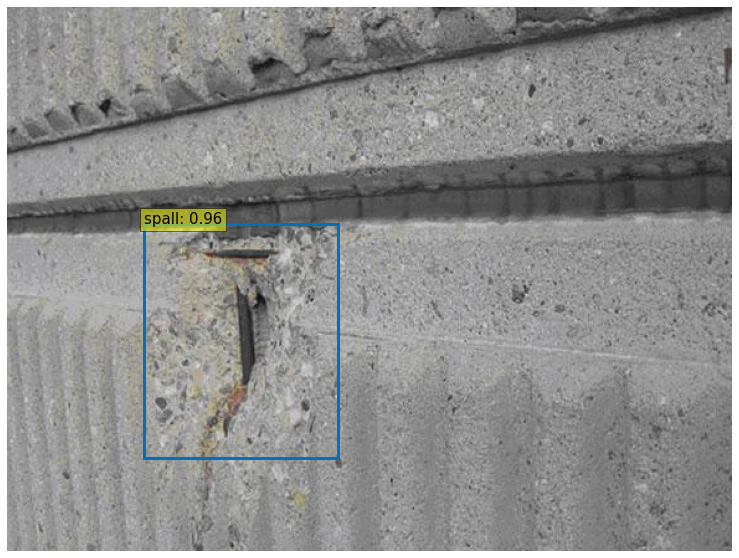

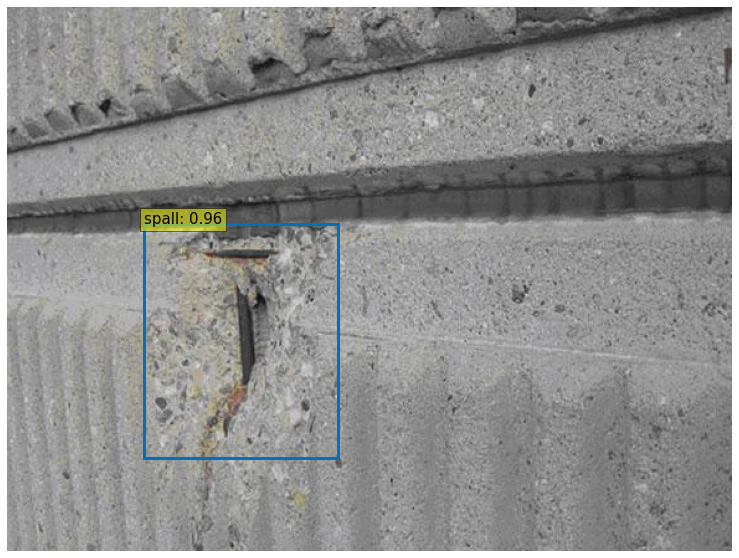

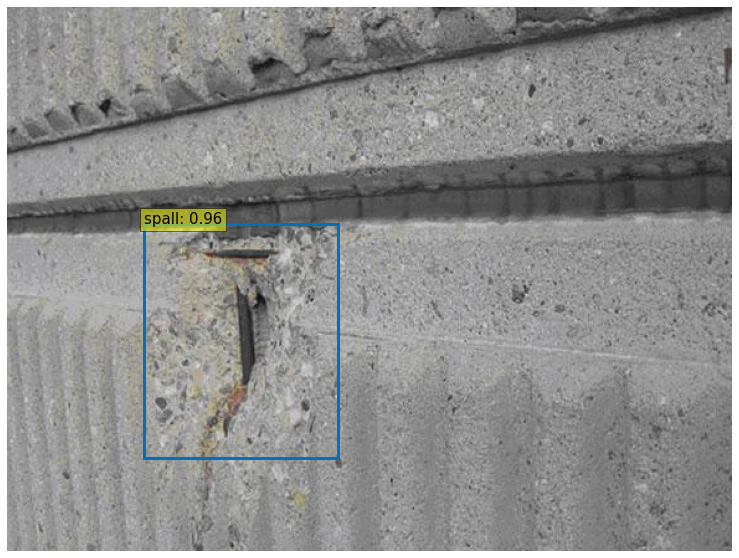

In [17]:
from PIL import Image

img_name = "/home/wenisch/Atom360/AI/Learning/data/dataset/images/00019.jpg"
im = Image.open(img_name)


run_worflow(im,
            model)

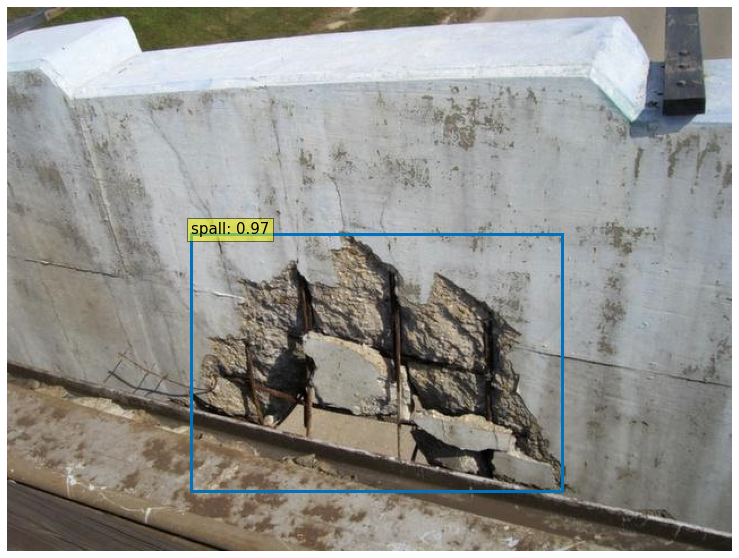

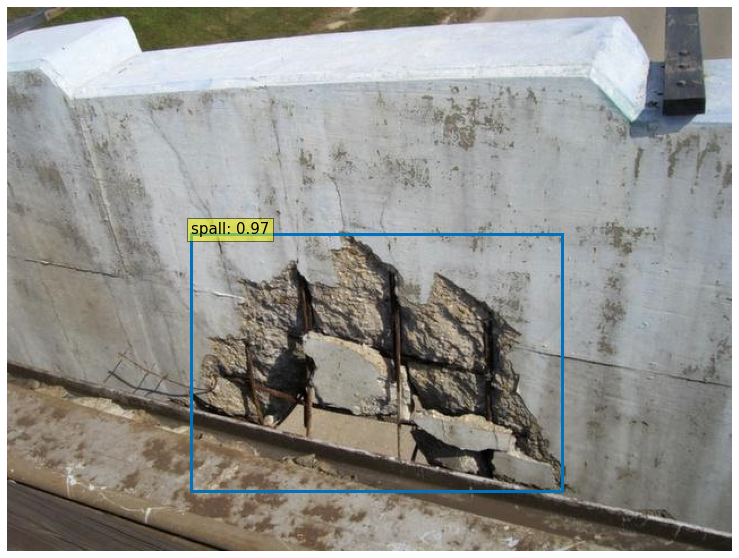

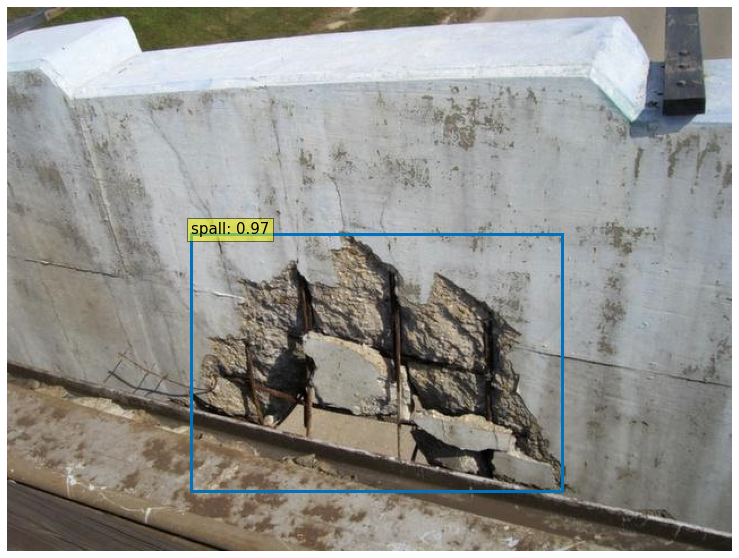

In [18]:
from PIL import Image

img_name = "/home/wenisch/Atom360/AI/Learning/data/dataset/images/00018.jpg"
im = Image.open(img_name)

run_worflow(im,
            model)